In [1]:
%load_ext autoreload
from PIL import Image
from  simulateur.picture_generation import *
import matplotlib.pyplot as plt
%matplotlib nbagg
import os
import cv2
import simulateur

In [2]:
%autoreload 2

In [3]:
%matplotlib nbagg

In [9]:
img = cv2.imread('../ground/IMG_1417.JPG')

In [10]:
img = cv2.resize(img, (3000,3000))

In [11]:
x0 = 100
y0 = 600
x1 = 450
y1 = 0
radius = 1000

### 1 - tracer la ligne centrale si elle est droite

In [13]:
x0 = 300 + 15
y0 = 600
x1 = 600 + 15
y1 = 300

<IPython.core.display.Javascript object>


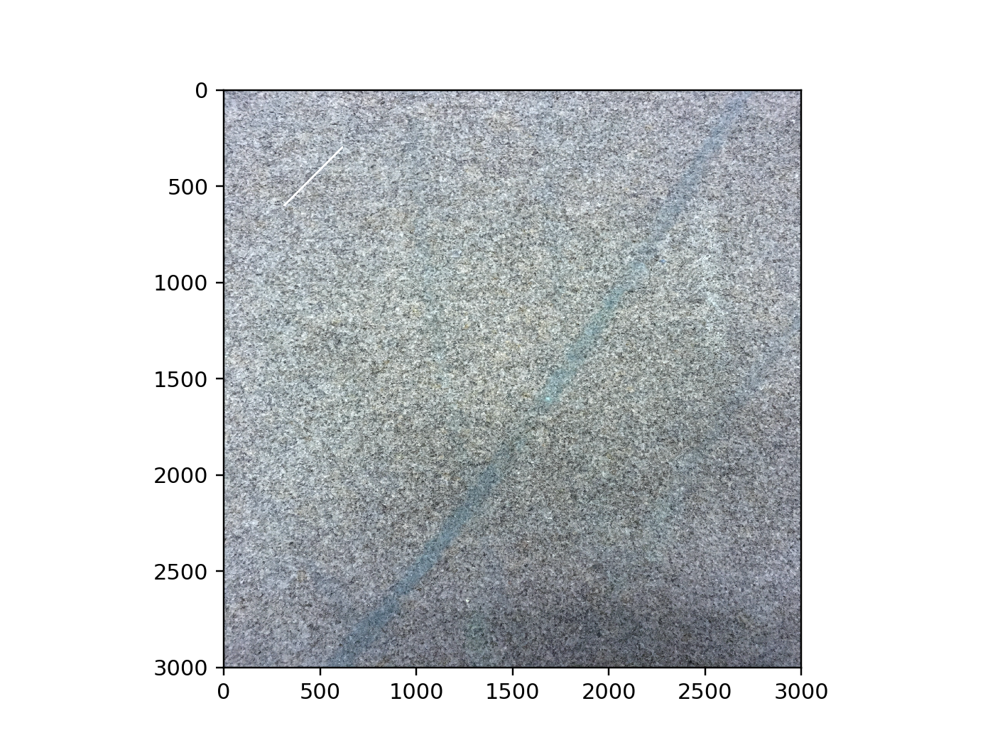

In [14]:
plt.imshow(cv2.line(img,(x0,y0), (x1,y1),(255,255,255),10))

In [11]:
y,x = np.ogrid[0: 600, 0: 600]
epsilon = 0.005
mask = np.abs((x - x0)/(x1 - x0) - (y - y0)/(y1 - y0)) <= epsilon
img[mask] = 30

In [12]:
y_ligne, x_ligne = np.where(mask == True)

In [13]:
car_position_x , car_position_y = (300, 600)

dists = list(((x_ligne - car_position_x)**2 + (y_ligne - car_position_y)**2))

index_projection = dists.index(min(dists))

projection_y = y_ligne[index_projection]

projection_x  = x_ligne[index_projection]

In [14]:
img[car_position_y-5:car_position_y+5, car_position_x-5:car_position_x+5] = 30

img[y_ligne[index_projection]-5:y_ligne[index_projection]+5, \
         x_ligne[index_projection]-5:x_ligne[index_projection]+5,] = 30

<IPython.core.display.Javascript object>


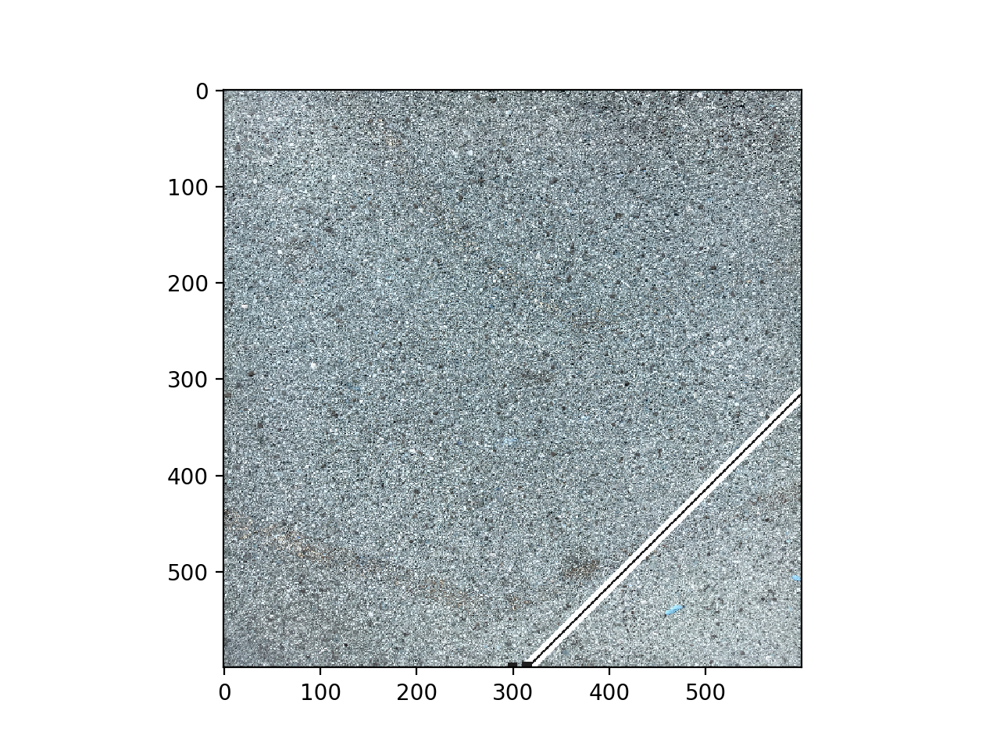

In [15]:
%matplotlib nbagg
plt.imshow(img)

In [159]:
dists = np.sqrt((x_ligne - projection_x)**2 + (y_ligne - projection_y)**2)

nb_pixel_correspondant_a_25cm = 100

points_to_consider = np.where(dists <= nb_pixel_correspondant_a_25cm)[0]

In [17]:
projection_y_cmd = y_ligne[min(points_to_consider)]
projection_x_cmd = x_ligne[min(points_to_consider)]

projection_y_cmd_2 = y_ligne[max(points_to_consider)]
projection_x_cmd_2 = x_ligne[max(points_to_consider)]

img[projection_y_cmd-5:projection_y_cmd+5, \
         projection_x_cmd-5:projection_x_cmd+5,] = 25

img[projection_y_cmd_2-5:projection_y_cmd_2+5, \
         projection_x_cmd_2-5:projection_x_cmd_2+5,] = 25

NameError: name 'points_to_consider' is not defined

<IPython.core.display.Javascript object>


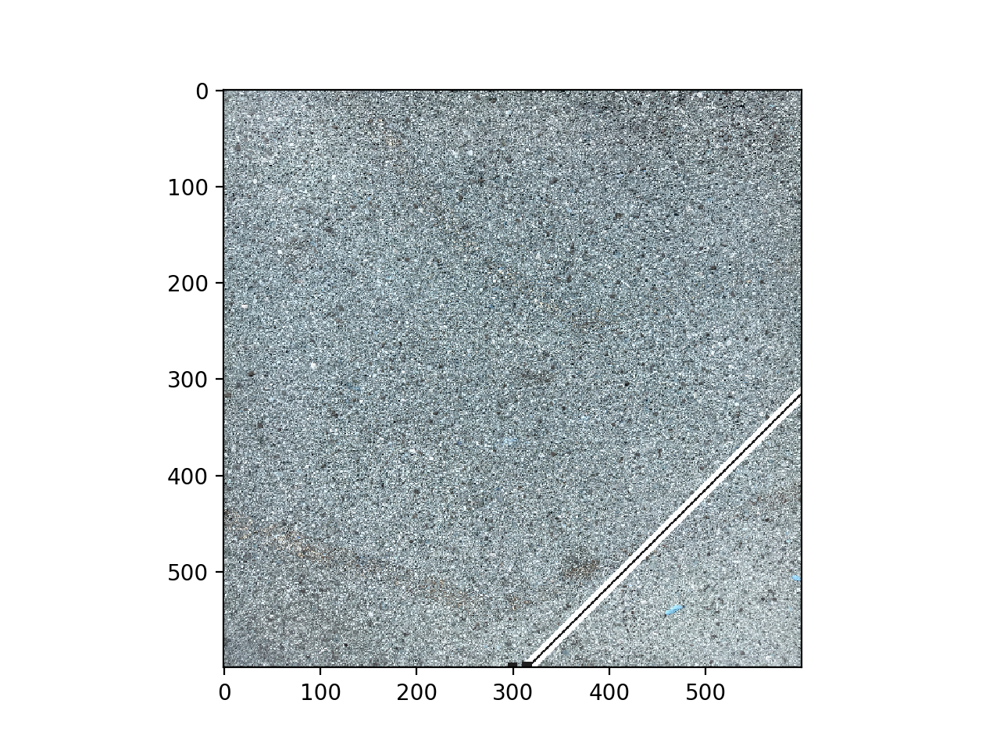

In [18]:
plt.imshow(img)

In [163]:
plt.imsave('../photos/test.jpg', img)

In [64]:
center = pts2cenater(pt0, pt1, radius, right_turn=True)

In [179]:
img.dtype

dtype('uint8')

In [183]:
resultat = 255*np.ones((1800,2400,  3), dtype='uint8')

In [185]:
resultat[1200:, 600:1200,:] = img

In [186]:
plt.imsave('../photos/test_large.jpg', resultat)

In [65]:
vars(center)

{'x': 1085.0086355325514, 'y': 772.5050373939882}

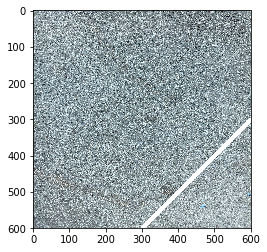

In [87]:
plt.imshow(cv2.line(img,(300,600), (600,300),(255,255,255),10))a

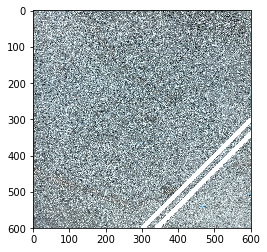

In [88]:
plt.imshow(cv2.line(img,(300+40,600), (600+40,300),(255,255,255),10))

# 2 - ellipse

In [ ]:
%matplotlib nbagg

In [37]:
illustrations = '/Users/constant.bridon/Documents/présentations/Big data vilnius/Big data vilnius 2018/illustrations/'

In [38]:
img = cv2.imread('../ground/IMG_1417.JPG')

In [40]:
img = cv2.resize(img, (1000,1000))

In [57]:
origin = Point(350, 1000)
end = Point(1000, 500)
radius = 800

In [58]:
img_drawn = draw_central_dashed_arc_on_ground(img, origin, end, radius, (148,252,9))

In [59]:
img_complet = draw_lateral_complete_arcs_on_ground(img_drawn, origin, end, radius, (255,255,255))

<IPython.core.display.Javascript object>


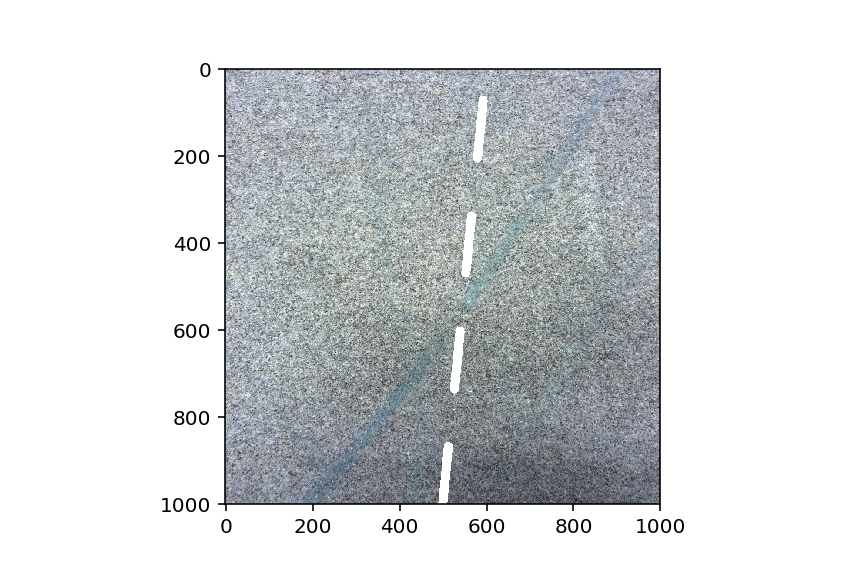

In [60]:
plt.imshow(img_complet)

In [61]:
plt.imsave(illustrations + 'curved_3.jpg',img_complet)

In [38]:
int(compute_command_arc(origin, end, radius))

39

In [16]:
center = center_coordinates(origin, end, radius)

In [20]:
y, x = np.ogrid[0: configuration['image_width'], 0: configuration['image_height']]
epsilon = 2
mask = np.abs(np.sqrt((center.x - x) ** 2 + (center.y - y) ** 2) - radius) <= epsilon
y_arc, x_arc = np.where(mask == True)

# computes the projection on line
car_position_x, car_position_y = (int(configuration['image_width'] / 2), configuration['image_height'])
dists_from_ligne = list(((x_arc - car_position_x) ** 2 + (y_arc - car_position_y) ** 2))
index_projection = dists_from_ligne.index(min(dists_from_ligne))  # output the first index, enough
projection_y = y_arc[index_projection]
projection_x = x_arc[index_projection]

# computes the destination point
dists = np.sqrt((x_arc - car_position_x) ** 2 + (y_arc - car_position_y) ** 2)

In [21]:
img_complet[mask] = 30

In [22]:
%matplotlib nbagg

<IPython.core.display.Javascript object>


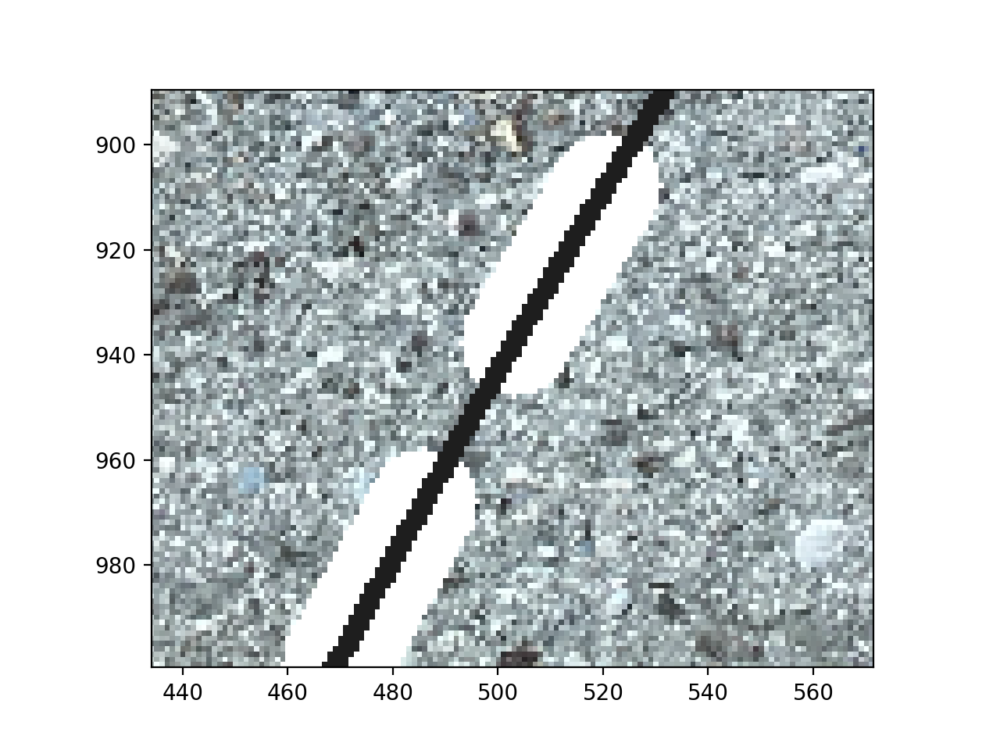

In [42]:
plt.imshow(img_complet)

In [24]:
points_to_consider = \
    np.where(dists <= configuration['command_distance_cm'] / configuration['conversion_pixel_to_cm'])[0]

In [27]:
min(points_to_consider)

3039

In [29]:
x_arc[3039], y_arc[3039]

(503, 934)

In [15]:
command_x = x_arc[min(points_to_consider)]
command_y = y_arc[min(points_to_consider)]

array([364, 364, 365, ..., 999, 999, 999])

In [33]:
command = Point(command_x, command_y)

In [45]:
vector = command - Point(x_arc[-1],y_arc[-1])

In [47]:
vector.y

-70

In [36]:
def dot_product(v, w):
    return v.x * w.x + v.y * w.y


def determinant(v, w):
    return v.x * w.y - v.y * w.x


def inner_angle(v, w):
    cosx = dot_product(v, w) / (length(v) * length(w))
    rad = acos(cosx)  # in radians
    return rad * 180 / pi  # returns degrees


def angle_clockwise(A, B):
    """
    CAUTION on IMAGE with OPENCV, axis X and axis Y are not DIRECTLY oriented
    :param A:
    :param B:
    :return:
    """
    inner = inner_angle(A, B)
    det = determinant(A, B)
    if det < 0:  # this is a property of the det. If the det < 0 then B is clockwise of A
        return inner
    else:  # if the det > 0 then A is immediately clockwise of B
        return -inner

In [48]:
vector.y

-70

In [49]:
base = Point(1, 0)

In [50]:
angle_clockwise(base, vector)

63.43494882292201

In [19]:
projection_x, projection_y

(477, 988)

In [30]:
destination = Point(x_arc[min(points_to_consider)], y_arc[min(points_to_consider)]) - \
              Point(int(configuration['image_width'] / 2), configuration['image_height'])

In [32]:
destination.y

-66

In [10]:
direction_of_sight = Point(int(configuration['image_width'] / 2), 0) - \
                     Point(int(configuration['image_width'] / 2), configuration['image_height'])

angular_command = angle_clockwise(direction_of_sight, destination)
return angular_command

In [12]:
direction_of_sight.x

500

In [39]:
img_final = 255*np.ones((3*img.shape[0],4*img.shape[1],3), dtype='uint8')

In [40]:
img_final[2*img.shape[0]:, img.shape[1]:2*img.shape[1],:]=img_complet

<IPython.core.display.Javascript object>


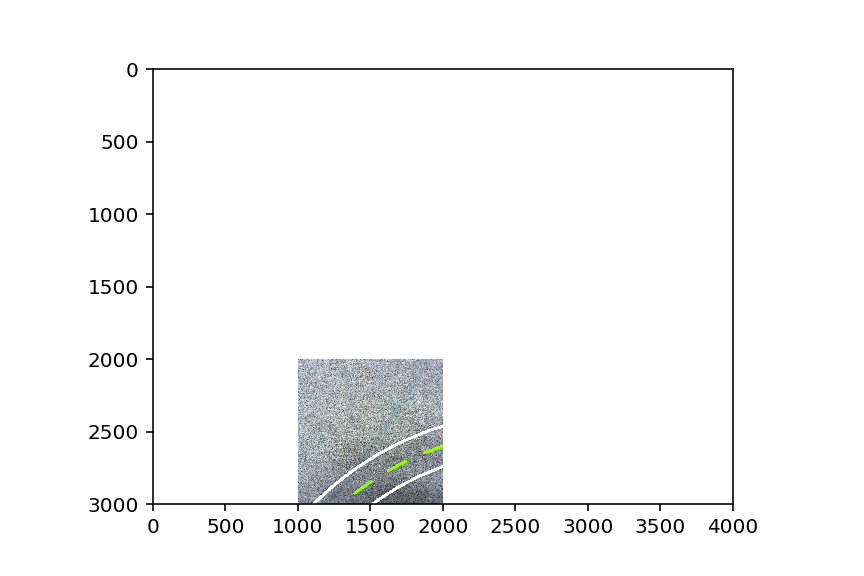

In [42]:
plt.imshow(img_final)

In [43]:
plt.imsave('../photos/test.jpg',img_final)

In [11]:
resultat = cv2.imread('../photos/povray_test_cob.pov.png')

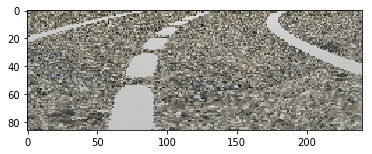

In [15]:
plt.imshow(resultat[90:,:,:])

In [10]:
cv2.imread('../../Photos/photo_fisheye_perspective_0/perspective_voiture2.jpg').shape

(1944, 2592, 3)

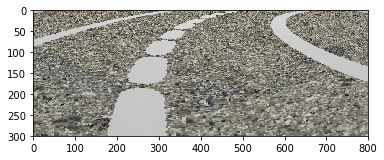

In [89]:
plt.imshow(resultat[300:,:,:])

In [72]:
img_complet.shape

(1000, 1000, 3)

In [71]:
plt.imsave('../photos/test.jpg',img_complet)

In [59]:
alpha = round(180 * (12/0.2)/(np.pi * 1000))

start_angles = np.arange(0, 360, alpha)
end_angles = np.arange(alpha, 361, alpha)

for i, couple in enumerate(zip(start_angles, end_angles)):
    if i%2 == 0:
        cv2.ellipse(img, (1085, 772),(1000, 1000), 0,couple[0],couple[1],(255,255,255), thickness=10)

<IPython.core.display.Javascript object>


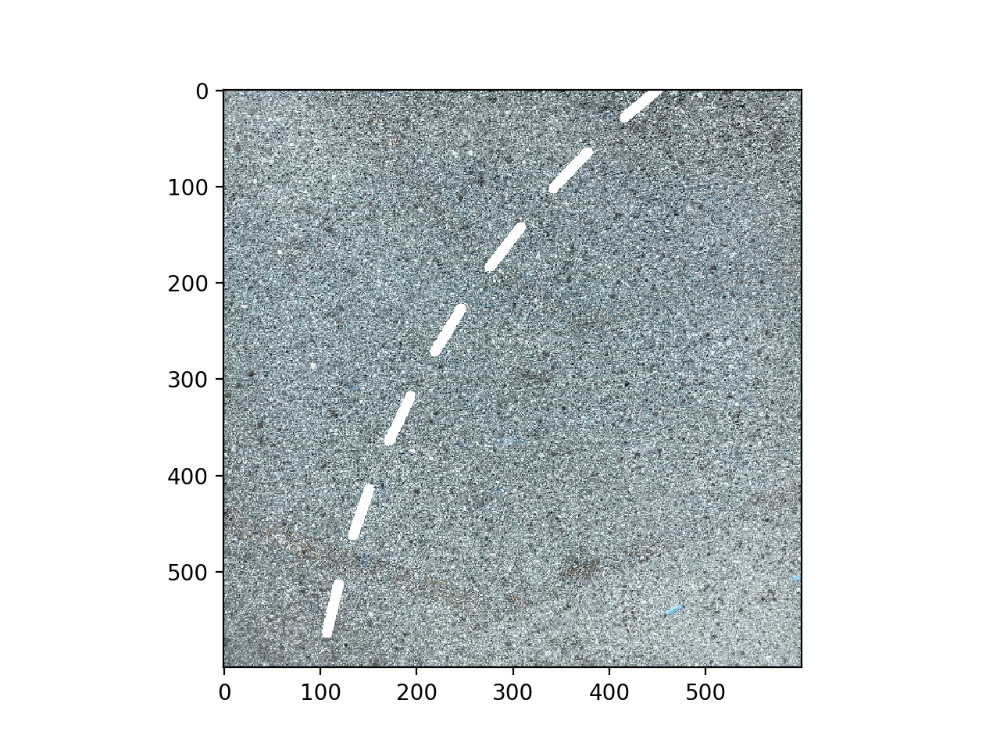

In [62]:
plt.imshow(img)

# 3 - ligne droite

In [ ]:
%matplotlib nbagg

In [66]:
img = cv2.imread('../ground/IMG_1417.JPG')
img = cv2.resize(img, (1000,1000))

In [104]:
origin = Point(280, 1000)
end = Point(1000,600)

In [105]:
img_drawn = draw_central_dashed_line_on_ground(img, origin, end, (148,252,9))

In [106]:
img_complete = draw_lateral_complete_lines_on_ground(img_drawn, origin, end, (255,255,255))

<IPython.core.display.Javascript object>


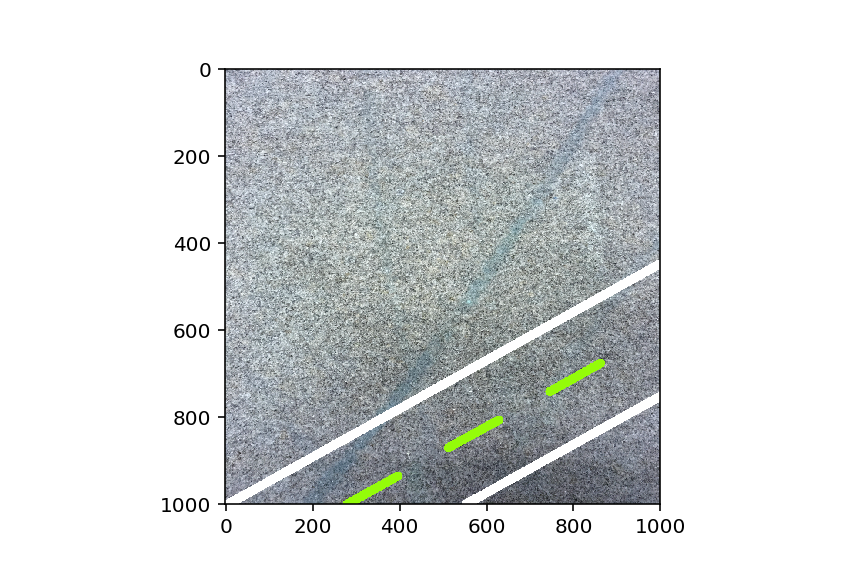

In [107]:
plt.imshow(img_complete)

In [108]:
plt.imsave(illustrations + 'straight_3.jpg',img_complete)

In [10]:
cmd = compute_command_line(origin, end)

In [11]:
cmd

85.66768601681147

In [33]:
plt.imsave('../photos/test.jpg',img_complete)

In [28]:
import os
p = os.popen('povray -Ipovray_test_cob.pov.j2 Height=176 Width=240 Output_File_Name={}_cmd'.format(int(cmd)),"r")

In [34]:
! povray -Ipovray_test_cob.pov.j2 Height=176 Width=240 Output_File_Name=berloul

povray: cannot open the user configuration file /Users/constant.bridon/.povray/3.7/povray.conf: No such file or directory
Persistence of Vision(tm) Ray Tracer Version 3.7.0.8.unofficial (clang++ 4.2.1 @
 x86_64-apple-darwin17.5.0)
This is an unofficial version compiled by:
 homebrew
 The POV-Ray Team is not responsible for supporting this version.

POV-Ray is based on DKBTrace 2.12 by David K. Buck & Aaron A. Collins
Copyright 1991-2013 Persistence of Vision Raytracer Pty. Ltd.

Primary POV-Ray 3.7 Architects/Developers: (Alphabetically)
  Chris Cason         Thorsten Froehlich  Christoph Lipka   

With Assistance From: (Alphabetically)
  Nicolas Calimet     Jerome Grimbert     James Holsenback    Christoph Hormann 
  Nathan Kopp         Juha Nieminen     

Past Contributors: (Alphabetically)
  Steve Anger         Eric Barish         Dieter Bayer        David K. Buck     
  Nicolas Calimet     Chris Cason         Aaron A. Collins    Chris Dailey      
  Steve Demlow        Andreas Dilg

# 4 - Couleurs des lignes

In [37]:
dash = cv2.imread('./IMG_8231.JPG')

In [64]:
np.max(dash, axis=(0, 1))

array([148, 255, 255], dtype=uint8)

In [43]:
dash.mean(axis = 0)

array([[ 46.83085317, 143.48511905, 125.02157738],
       [ 46.60143849, 143.3546627 , 124.87202381],
       [ 46.45833333, 143.45262897, 124.72743056],
       ...,
       [ 67.72619048, 118.40922619, 105.61631944],
       [ 67.69196429, 118.41666667, 105.57614087],
       [ 67.5062004 , 118.24429563, 105.4015377 ]])